# Import essential libaries 

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import missingno as msno
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')

## Read data

In [2]:
data = pd.read_csv('Corona_NLP_train.csv',encoding='latin-1')
data['TweetAt'] = pd.to_datetime(data['TweetAt'])
data['Length'] = data['OriginalTweet'].apply(len)

## Data informations

In [3]:
data.head()

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,Length
0,3799,48751,London,2020-03-16,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,111
1,3800,48752,UK,2020-03-16,advice Talk to your neighbours family to excha...,Positive,237
2,3801,48753,Vagabonds,2020-03-16,Coronavirus Australia: Woolworths to give elde...,Positive,131
3,3802,48754,NaN,2020-03-16,My food stock is not the only one which is emp...,Positive,306
4,3803,48755,NaN,2020-03-16,"Me, ready to go at supermarket during the #COV...",Extremely Negative,310


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41157 entries, 0 to 41156
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   UserName       41157 non-null  int64         
 1   ScreenName     41157 non-null  int64         
 2   Location       32567 non-null  object        
 3   TweetAt        41157 non-null  datetime64[ns]
 4   OriginalTweet  41157 non-null  object        
 5   Sentiment      41157 non-null  object        
 6   Length         41157 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 2.2+ MB


In [5]:
data.columns

Index(['UserName', 'ScreenName', 'Location', 'TweetAt', 'OriginalTweet',
       'Sentiment', 'Length'],
      dtype='object')

## Explonatory Data Analysis

## Checking missing values

In [6]:
data.isnull().sum()

UserName            0
ScreenName          0
Location         8590
TweetAt             0
OriginalTweet       0
Sentiment           0
Length              0
dtype: int64

## Droping missing values

In [7]:
data.dropna(inplace=True)
data

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment,Length
0,3799,48751,London,2020-03-16,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,111
1,3800,48752,UK,2020-03-16,advice Talk to your neighbours family to excha...,Positive,237
2,3801,48753,Vagabonds,2020-03-16,Coronavirus Australia: Woolworths to give elde...,Positive,131
5,3804,48756,"ÃT: 36.319708,-82.363649",2020-03-16,As news of the regionÂs first confirmed COVID...,Positive,250
6,3805,48757,"35.926541,-78.753267",2020-03-16,Cashier at grocery store was sharing his insig...,Positive,180
...,...,...,...,...,...,...,...
41147,44946,89898,"Brooklyn, NY",2020-04-14,YÂall really shitting that much more at home?...,Negative,82
41149,44948,89900,"Toronto, Ontario",2020-04-14,Still shocked by the number of #Toronto superm...,Negative,177
41150,44949,89901,OHIO,2020-04-14,I never that weÂd be in a situation &amp; wor...,Positive,199
41152,44951,89903,"Wellington City, New Zealand",2020-04-14,Airline pilots offering to stock supermarket s...,Neutral,102


In [8]:
data.isnull().sum()

UserName         0
ScreenName       0
Location         0
TweetAt          0
OriginalTweet    0
Sentiment        0
Length           0
dtype: int64

## Duplicate data 

In [9]:
print("Duplicates data")
print(data.duplicated().sum())

Duplicates data
0


## Data visualisation 

### Bar chart for Sentiment distribution

In [10]:
sentiment_counts = data['Sentiment'].value_counts()
fig1 = px.bar(sentiment_counts, x=sentiment_counts.index, y=sentiment_counts.values, labels={'x': 'Sentiment', 'y': 'Count'})
fig1.update_layout(title_text='Sentiment Distribution')
fig1.show()

### Histogram of tweet lengths

In [11]:
fig2 = px.histogram(data, x='Length', title='Distribution of Tweet Lengths')
fig2.show()

### Pie chart for Location

In [12]:
location_counts = data['Location'].value_counts().head(10)
fig3 = px.pie(location_counts, values=location_counts.values, names=location_counts.index, title='Top 10 Tweet Locations')
fig3.show()

### Sentiment analysis plot

In [13]:
sentiment = data["Sentiment"].value_counts()
fig = px.pie(values=sentiment.values, 
             names=sentiment.index,
             color_discrete_sequence=px.colors.sequential.Greens)
fig.update_traces(textposition='inside',
                  textfont_size=11,
                  textinfo='percent+label')
fig.update_layout(title_text="Category Pie Graph",
                  uniformtext_minsize=12, 
                  uniformtext_mode='hide')
fig.show()

### Scatter plot for TweetAt vs. Length

In [14]:
fig4 = px.scatter(data, x='TweetAt', y='Length', title='Tweet Length over Time')
fig4.show()

### Box plot for Length by Sentiment

In [15]:
fig5 = px.box(data, x='Sentiment', y='Length', title='Length by Sentiment')
fig5.show()

### Top 10 Most Frequent Words in Tweets

In [16]:
from collections import Counter
import plotly.graph_objects as go

words = ' '.join(data['OriginalTweet']).split()
word_counts = Counter(words)
top_words = word_counts.most_common(10)
word, count = zip(*top_words)
fig6 = go.Figure(data=[go.Bar(x=word, y=count)])
fig6.update_layout(title_text='Top 10 Most Frequent Words in Tweets', xaxis_title='Words', yaxis_title='Count')
fig6.show()

## Sentiments Analysis

### Word cloud for OriginalTweet

(-0.5, 799.5, 399.5, -0.5)

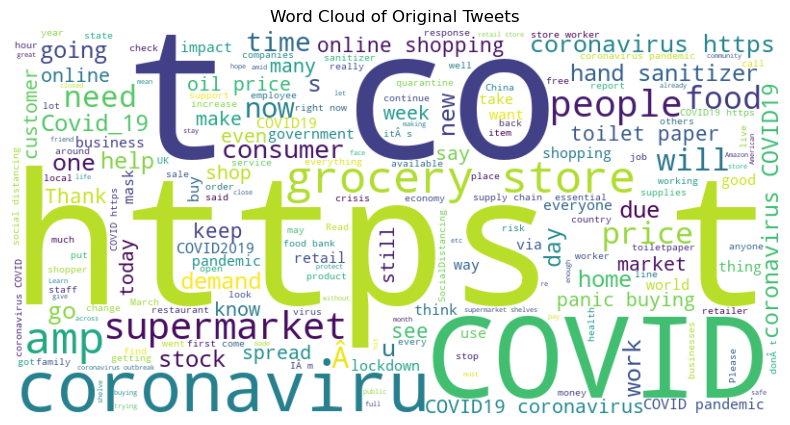

In [17]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(data['OriginalTweet']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Original Tweets')
plt.axis('off')

### Filtering the data for each sentiment category

In [18]:
extremely_positive_tweets = data[data['Sentiment'] == 'Extremely Positive']
positive_tweets = data[data['Sentiment'] == 'Positive']
neutral_tweets = data[data['Sentiment'] == 'Neutral']
negative_tweets = data[data['Sentiment'] == 'Negative']
extremely_negative_tweets = data[data['Sentiment'] == 'Extremely Negative']

### Generating and display a Word Cloud

In [19]:
def generate_wordcloud(sentiment_tweets, sentiment_name):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(sentiment_tweets['OriginalTweet']))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud of {sentiment_name} Sentiment')
    plt.axis('off')
    plt.show()

### Generating Word Clouds for each sentiment category

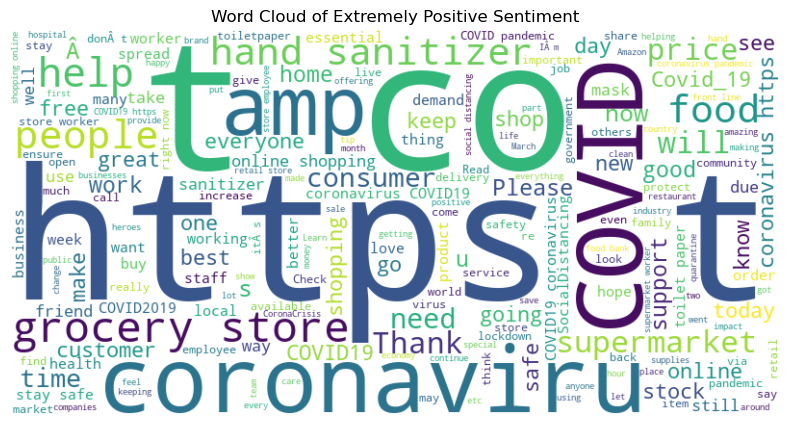

In [20]:
generate_wordcloud(extremely_positive_tweets, 'Extremely Positive')

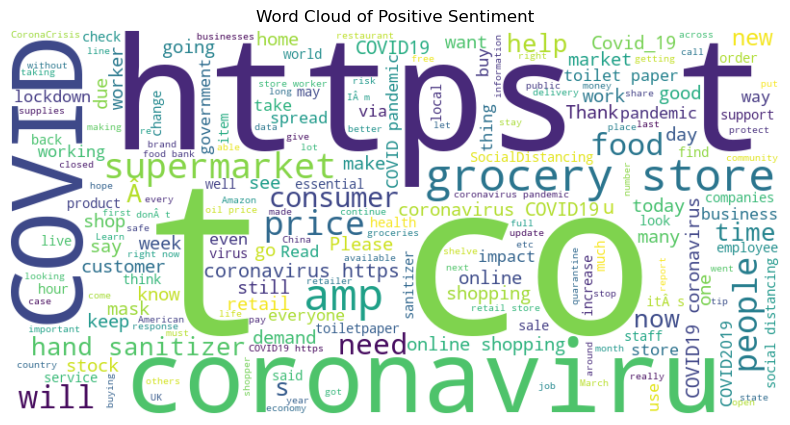

In [21]:
generate_wordcloud(positive_tweets, 'Positive')

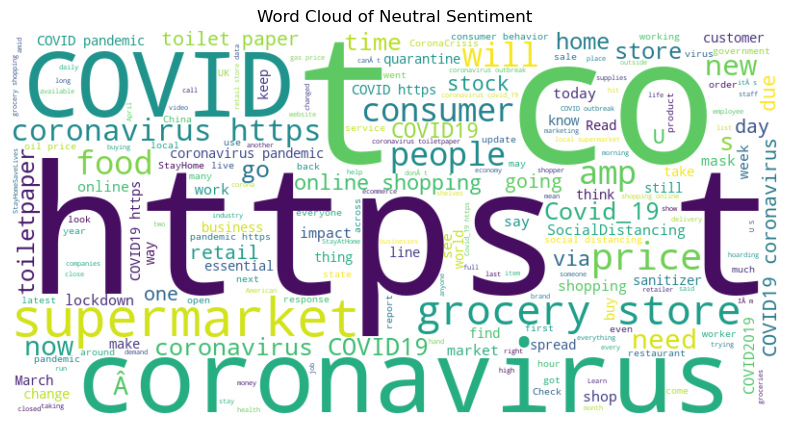

In [22]:
generate_wordcloud(neutral_tweets, 'Neutral')

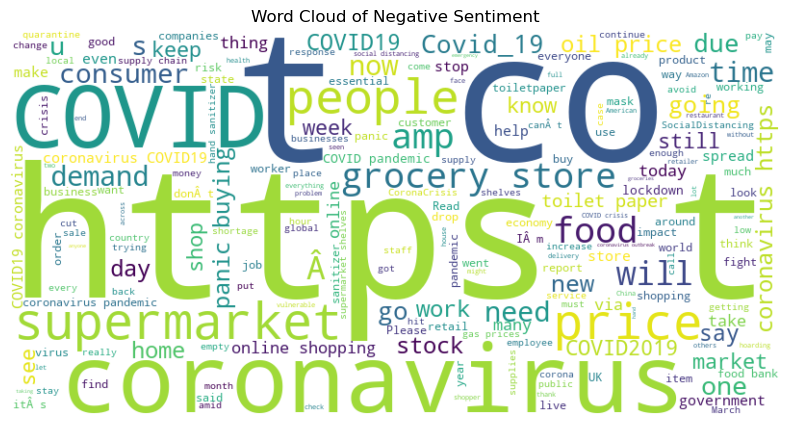

In [23]:
generate_wordcloud(negative_tweets, 'Negative')

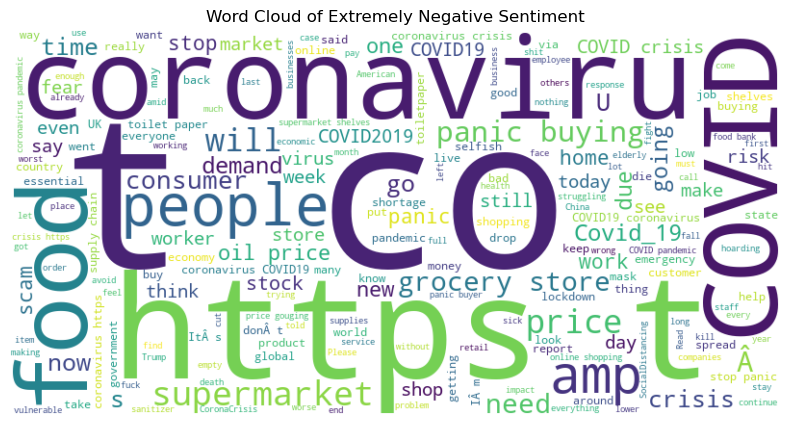

In [24]:
generate_wordcloud(extremely_negative_tweets, 'Extremely Negative')

### Tweets Text Data Analysis

In [25]:
import nltk
from nltk.util import ngrams
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from nltk.stem import WordNetLemmatizer
from yellowbrick.cluster import KElbowVisualizer
plt.style.use('default')
import re

In [26]:
text_column = 'OriginalTweet'

##  Data Preprocessing

### Text cleaning and lemmatization

In [27]:
lemmatizer = WordNetLemmatizer()
data[text_column] = data[text_column].apply(lambda text: ' '.join(lemmatizer.lemmatize(word) for word in text.split()))
data[text_column] = data[text_column].apply(lambda text: re.sub(r'[^a-zA-Z\s]', '', text).lower())

### CountVectorizer

In [28]:
count_vectorizer = CountVectorizer(max_df=0.8, max_features=1000)
count_matrix = count_vectorizer.fit_transform(data[text_column])

### TfidfTransformer

In [29]:
tfidf_transformer = TfidfTransformer()
tfidf_matrix = tfidf_transformer.fit_transform(count_matrix)

### Determining the optimal number of clusters using the Elbow method and Silhouette score

In [30]:
wcss = []  
silhouette_scores = []

In [31]:
for num_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(tfidf_matrix)
    wcss.append(kmeans.inertia_)
    
    # Calculate Silhouette score
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(tfidf_matrix, labels)
    silhouette_scores.append(silhouette_avg)

### Ploting the Elbow curve

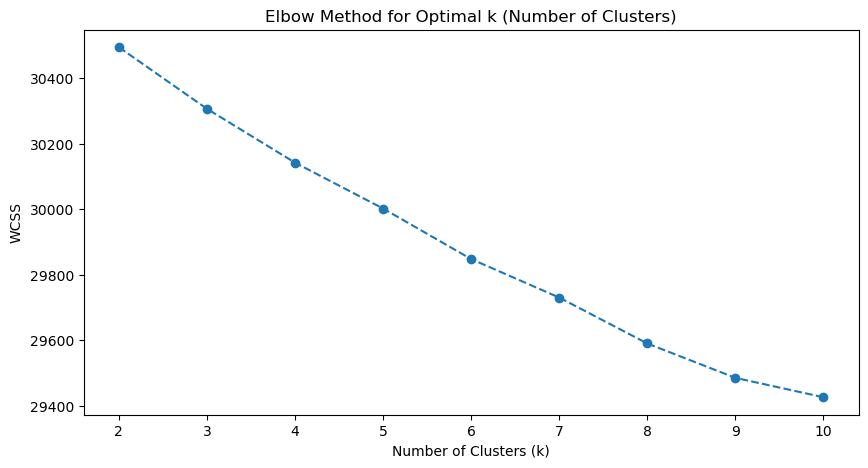

In [32]:
plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k (Number of Clusters)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.show()

### Ploting Silhouette scores

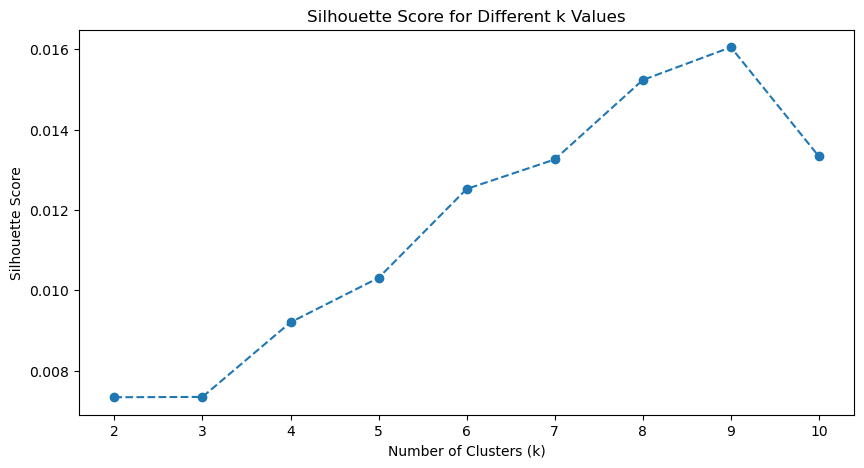

In [33]:
plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Score for Different k Values')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

## Number of clusters

In [34]:
num_clusters = 5

## K-means clustering

In [35]:
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(tfidf_matrix)

KMeans(n_clusters=5, random_state=42)

### Cluster labels to  dataset

In [36]:
data['Cluster'] = kmeans.labels_

### Standardize the data first

In [37]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(tfidf_matrix.toarray())

### Performing PCA

In [38]:
pca = PCA(n_components=2)  
pca_result = pca.fit_transform(scaled_data)

### Add PCA components to the dataset

In [39]:
data['PCA1'] = pca_result[:, 0]
data['PCA2'] = pca_result[:, 1]

### Visualize the clustered data using PCA

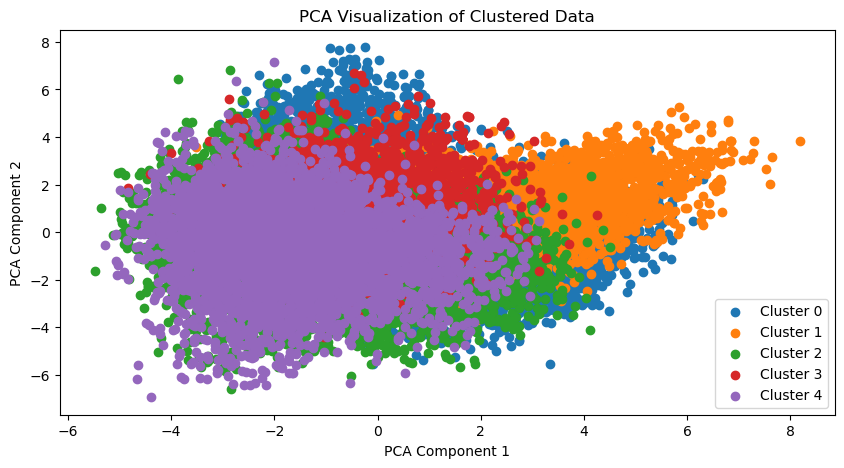

In [40]:
plt.figure(figsize=(10, 5))
for cluster in range(num_clusters):
    cluster_data = data[data['Cluster'] == cluster]
    plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label=f'Cluster {cluster}')

plt.title('PCA Visualization of Clustered Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

## Exploring the clustered tweets result for different clusters with word clouds

Cluster 0 Word Cloud:


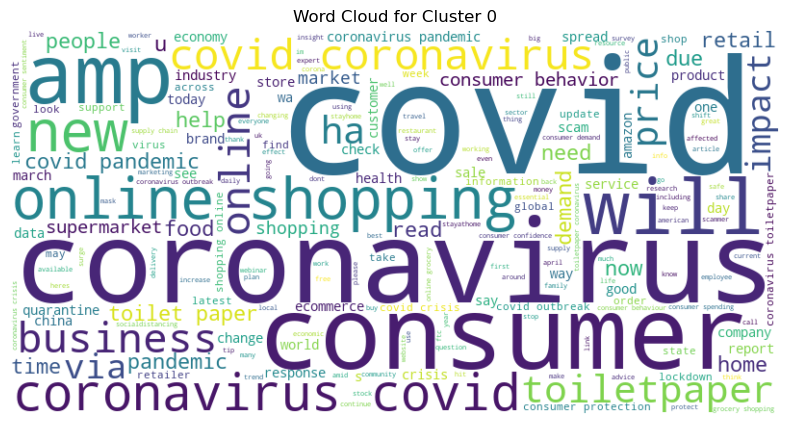

Cluster 1 Word Cloud:


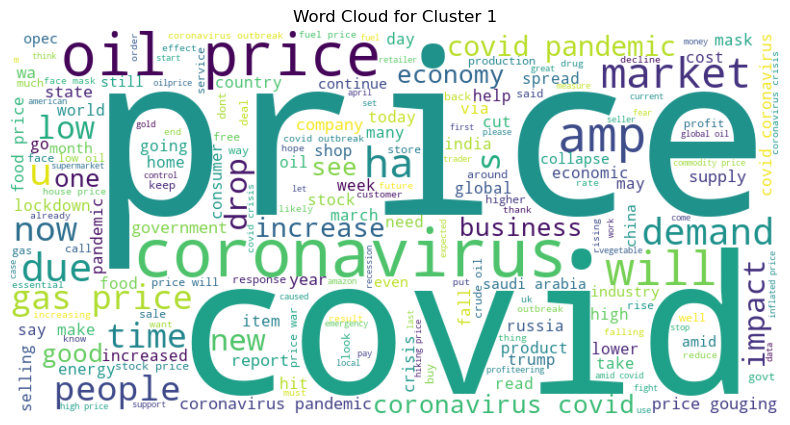

Cluster 2 Word Cloud:


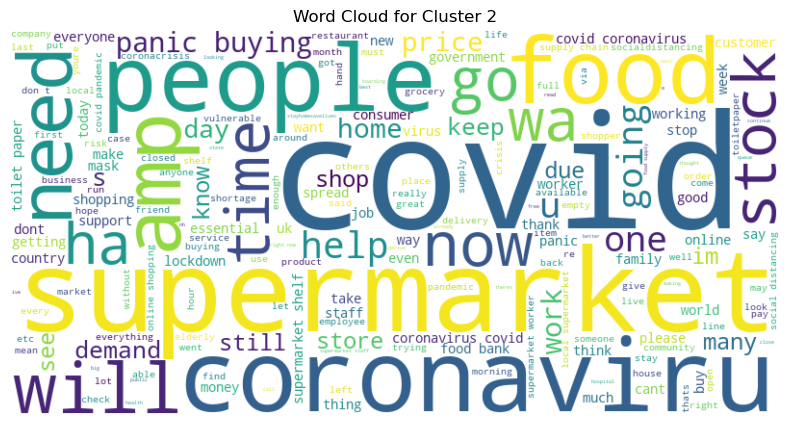

Cluster 3 Word Cloud:


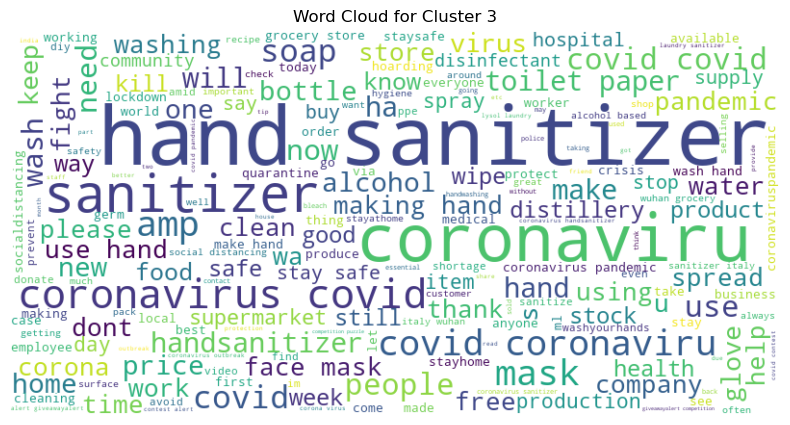

Cluster 4 Word Cloud:


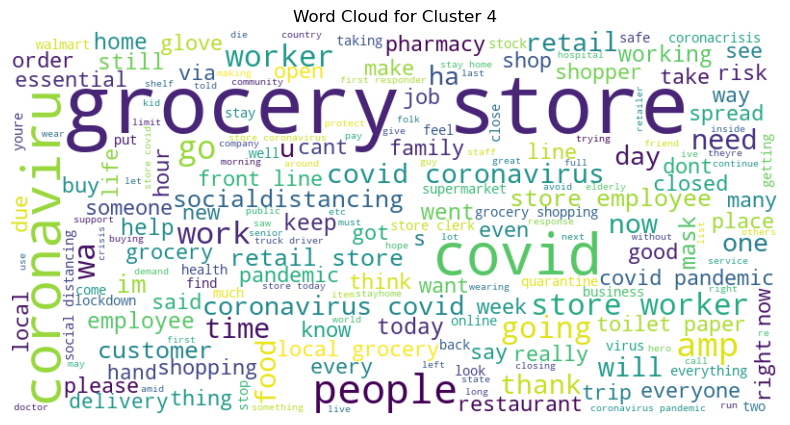

In [41]:
for cluster in range(num_clusters):
    print(f"Cluster {cluster} Word Cloud:")
    cluster_tweets = data[data['Cluster'] == cluster]['OriginalTweet']
    cluster_text = ' '.join(cluster_tweets)
    
    # Generating a word cloud for the cluster
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster}')
    plt.axis('off')
    plt.show()

## Hierarchical Clustering method

In [42]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from nltk.stem import WordNetLemmatizer

## Applying Agglomerative Hierarchical Clustering

In [43]:
n_clusters = 4 
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
hierarchical_labels = agg_clustering.fit_predict(tfidf_matrix.toarray())

### Adding cluster labels

In [44]:
data['Cluster'] = hierarchical_labels

### Visualizing the hierarchical clustering with a dendrogram

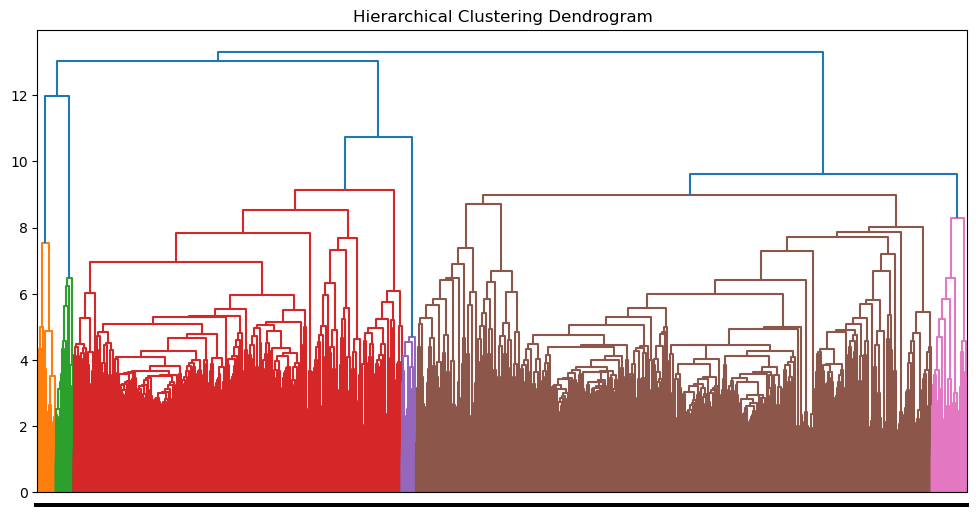

In [45]:
data['Cluster'] = np.random.randint(0, 4, size=len(data))

# Mapping from original cluster labels to unique labels
unique_labels = sorted(data['Cluster'].unique())
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}
data['Cluster'] = data['Cluster'].map(label_mapping)
linkage_matrix = linkage(tfidf_matrix.toarray(), method='ward') 
dendrogram_labels = [label_mapping[cluster] for cluster in data['Cluster']]

# Creating the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, orientation="top", labels=dendrogram_labels, distance_sort='descending')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

In [46]:
# Number of clusters for K-means and hierarchical clustering  
hierarchical_clusters = 4 

## Silhouette Score

In [47]:
hierarchical_silhouette_score = silhouette_score(tfidf_matrix, hierarchical_labels)

## Calculating Davies-Bouldin Index

In [48]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
hierarchical_davies_bouldin = davies_bouldin_score(tfidf_matrix.toarray(), hierarchical_labels)
print(f'Hierarchical Silhouette Score: {hierarchical_silhouette_score}')
print(f'Hierarchical Davies-Bouldin Index: {hierarchical_davies_bouldin}')

Hierarchical Silhouette Score: 0.0017733239025302457
Hierarchical Davies-Bouldin Index: 11.52150311646319
